<a href="https://colab.research.google.com/github/eleanarey/TFM-MUII-UOC/blob/main/4to_experimento_MobileViT_y_text_recognition_optimizado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ver repositorios de código en Github:  

- TFM Implementacion_de_Mobile_ViT: https://github.com/eleanarey/TFM-MUII-UOC/blob/main/Implementacion_de_Mobile_ViT.ipynb

- Qualcomm Mobile ViT: https://github.com/quic/ai-hub-models/tree/main/qai_hub_models/models/mobile_vit

- Apple Mobile ViT: https://github.com/apple/ml-cvnets/tree/main

- Vision Transformer: https://github.com/google-research/vision_transformer

- CLIP: https://github.com/openai/CLIP


---


# Referencias:

- Mehta, S., Rastegari, M., Caspi, A., & Hajishirzi, H. (2022). **MobileViT: Light-weight, General-purpose, and Mobile-friendly Vision Transformer**. *arXiv preprint arXiv:2110.02178*. Recuperado de [https://arxiv.org/abs/2110.02178](https://arxiv.org/abs/2110.02178)

- Howard, A. G., Zhu, M., Chen, B., Kalenichenko, D., Wang, W., Weyand, T., Andreetto, M., & Adam, H. (2017). **MobileNets: Efficient Convolutional Neural Networks for Mobile Vision Applications**. *arXiv preprint arXiv:1704.04861*. Recuperado de [https://arxiv.org/abs/1704.04861](https://arxiv.org/abs/1704.04861)

- Sandler, M., Howard, A., Zhu, M., Zhmoginov, A., & Chen, L.-C. (2018). **MobileNetV2: Inverted Residuals and Linear Bottlenecks**. *arXiv preprint arXiv:1801.04381*. Recuperado de [https://arxiv.org/abs/1801.04381](https://arxiv.org/abs/1801.04381)

- Dosovitskiy, A., Beyer, L., Kolesnikov, A., Weissenborn, D., Zhai, X., Unterthiner, T., ... & Houlsby, N. (2020). **An Image Is Worth 16x16 Words: Transformers for Image Recognition at Scale (ViT)**. *arXiv preprint arXiv:2010.11929*. Recuperado de [https://arxiv.org/abs/2010.11929](https://arxiv.org/abs/2010.11929)

- Radford, A., Kim, J. W., Hallacy, C., Ramesh, A., Goh, G., Agarwal, S., ... & Sutskever, I. (2021). **Learning Transferable Visual Models From Natural Language Supervision (CLIP)**. *arXiv preprint arXiv:2103.00020*. Recuperado de [https://arxiv.org/pdf/2103.00020](https://arxiv.org/pdf/2103.00020)

- Vaswani, A., Shazeer, N., Parmar, N., Uszkoreit, J., Jones, L., Gomez, A. N., Kaiser, Ł., & Polosukhin, I. (2017). **Attention Is All You Need (Transformers)**. *arXiv preprint arXiv:1706.03762*. Recuperado de [https://arxiv.org/abs/1706.03762](https://arxiv.org/abs/1706.03762)

---

# Ver proyectos en Hugging Face:

- Apple Mobile ViT Small: https://huggingface.co/apple/mobilevit-small

- Mobile ViT qualcomm: https://huggingface.co/qualcomm/Mobile_Vit

- MobileNets: https://huggingface.co/google/mobilenet_v2_1.0_224

- Vision Transformer (base-sized model): https://huggingface.co/google/vit-base-patch16-224-in21k

- CLIP: https://huggingface.co/openai/clip-vit-base-patch32

---

# Ver principales Datasets publicos referenciados y utilizados en los modelos:

- Tini ImageNet: https://paperswithcode.com/dataset/tiny-imagenet

- Imagenet: https://www.image-net.org/

- Flickr8k: https://huggingface.co/datasets/Naveengo/flickr8k

- MSRA-TD500: https://huggingface.co/datasets/yunusserhat/MSRA-TD500-Dataset

---

Código disponible en Colab:

<a href="https://colab.research.google.com/drive/1Cj246i8QJ8z3Z71Bbfhez4HU1LHlqzZG"
target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title Licensed under the BSD 3-Clause License
# The license for the original implementation of Mobile_Vit
#Copyright (c) Soumith Chintala 2016,
#All rights reserved.

# https://github.com/pytorch/vision/blob/main/LICENSE

#Redistribution and use in source and binary forms, with or without
#modification, are permitted provided that the following conditions are met:
#
#* Redistributions of source code must retain the above copyright notice, this
#  list of conditions and the following disclaimer.
#
#* Redistributions in binary form must reproduce the above copyright notice,
#  this list of conditions and the following disclaimer in the documentation
#  and/or other materials provided with the distribution.
#
#* Neither the name of the copyright holder nor the names of its
#  contributors may be used to endorse or promote products derived from
#  this software without specific prior written permission.
#
#THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS"
#AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE
#IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE
#DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE
#FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL
#DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR
#SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER
#CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY,
#OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE
#OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

In [3]:
#@markdown Select whether you would like to store data in your personal drive.
#@markdown
#@markdown If you select **yes**, you will need to authorize Colab to access
#@markdown your personal drive
#@markdown
#@markdown If you select **no**, then any changes you make will diappear when
#@markdown this Colab's VM restarts after some time of inactivity...
use_gdrive = 'yes'  #@param ["yes", "no"]


if use_gdrive == 'yes':
  from google.colab import drive
  # Montar Google Drive
  # "comentamos esta celda y añadimos la siguiente" drive.mount('/gdrive')
  drive.mount('/content/drive', force_remount=True)
  # Ruta al archivo ZIP en Google Drive
  # "comentamos esta celda y añadimos la siguiente" root = '/gdrive/My Drive/vision_transformer_colab'
  root = "/content/drive/MyDrive/Colab_Notebooks"
  import os
  if not os.path.isdir(root):
    os.mkdir(root)
  os.chdir(root)
  print(f'\nChanged CWD to "{root}"')
else:
  from IPython import display
  display.display(display.HTML(
      '<h1 style="color:red">CHANGES NOT PERSISTED</h1>'))

Mounted at /content/drive

Changed CWD to "/content/drive/MyDrive/Colab_Notebooks"


In [7]:
# Clonar el repositorio
!git clone https://github.com/quic/ai-hub-models.git
%cd ai-hub-models/qai_hub_models/models/mobile_vit
!pip install -r requirements.txt
!pip install "qai_hub_models[mobile-vit]"
!pip install transformers torch torchvision


Cloning into 'ai-hub-models'...
remote: Enumerating objects: 14428, done.
remote: Counting objects: 100% (2131/2131), done.
remote: Compressing objects: 100% (731/731), done.
remote: Total 14428 (delta 1771), reused 1559 (delta 1396), pack-reused 12297 (from 2)
Receiving objects: 100% (14428/14428), 258.58 MiB | 20.41 MiB/s, done.
Resolving deltas: 100% (11595/11595), done.
Updating files: 100% (1707/1707), done.
/content/drive/MyDrive/Colab_Notebooks/ai-hub-models/qai_hub_models/models/mobile_vit
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 92.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 100.5 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.21.0
    Uninstalling to

In [1]:
# 1. Carga de datos
# En conjunto de datos está dividido en dos carpetas: text (con texto) y no_text (sin texto).
# Usa torchvision.datasets.ImageFolder para cargar estos datos y dividirlos en conjuntos de entrenamiento y validación.

import os
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# Justificación de las transformaciones:
# 1. **Resize a 224x224**: MobileViT está entrenado con este tamaño de entrada.
# 2. **ToTensor**: Convierte las imágenes a tensores PyTorch en el rango [0, 1].
# 3. **Normalize con estadísticas de ImageNet**:
#    MobileViT fue preentrenado en ImageNet, por lo que usamos sus medias y desviaciones estándar.

# Transformaciones para entrenamiento y validación
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Tamaño compatible con MobileViT
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),  # Aumentación de datos
    transforms.RandomRotation(15),     # Aumentación de datos
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalización basada en ImageNet
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Tamaño compatible con MobileViT
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalización basada en ImageNet
])

# Cargar el dataset con ImageFolder
dataset_path = "/content/drive/MyDrive/Colab_Notebooks/dataset/text_recognition_balanceado"
dataset = datasets.ImageFolder(root=dataset_path)

# Dividir en entrenamiento y validación
train_size = int(0.8 * len(dataset))  # 80% para entrenamiento
val_size = len(dataset) - train_size  # 20% para validación
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Asignar transformaciones específicas
train_dataset.dataset.transform = train_transform
val_dataset.dataset.transform = val_transform

# Crear dataloaders
batch_size = 32  # Tamaño común para GPUs con memoria moderada
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Información de los DataLoaders
print("Datasets y DataLoaders creados exitosamente.")
print(f"Clases: {dataset.classes}")  # Nombres de las carpetas en el dataset
print(f"Tamaño del conjunto de entrenamiento: {len(train_loader.dataset)}")
print(f"Tamaño del conjunto de validación: {len(val_loader.dataset)}")


Datasets y DataLoaders creados exitosamente.
Clases: ['no_text', 'text']
Tamaño del conjunto de entrenamiento: 320
Tamaño del conjunto de validación: 80


In [2]:
#2. Configura el modelo MobileViT
#   Carga MobileViT preentrenado y ajusta la última capa para clasificar imágenes en 2 clases (text y no_text).

#from model import MobileVIT
from qai_hub_models.models.mobile_vit.model import MobileVIT

# Cargar el modelo preentrenado
model = MobileVIT.from_pretrained()

# Configura la última capa para tu caso específico (2 clases: text y no_text)
import torch.nn as nn
model.net.classifier = nn.Linear(model.net.classifier.in_features, 2)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/187 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/mobilevit/feature_extraction_mobilevit.py:28: FutureWarning: The class MobileViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use MobileViTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/22.5M [00:00<?, ?B/s]

In [3]:
# 3. Definir el optimizador y la función de pérdida
#    Configura el optimizador y la función de pérdida para el entrenamiento.

import torch.optim as optim

criterion = nn.CrossEntropyLoss()  # Pérdida de clasificación
optimizer = optim.Adam(model.parameters(), lr=0.001)  # Optimizador Adam:Es una elección estándar para optimizadores como Adam, balanceando convergencia rápida y estabilidad.


Epoch 1/10, Loss: 0.3214, Validation Accuracy: 93.75%
Epoch 2/10, Loss: 0.0901, Validation Accuracy: 86.25%
Epoch 3/10, Loss: 0.0576, Validation Accuracy: 98.75%
Epoch 4/10, Loss: 0.0364, Validation Accuracy: 98.75%
Epoch 5/10, Loss: 0.0256, Validation Accuracy: 97.50%
Epoch 6/10, Loss: 0.0213, Validation Accuracy: 98.75%
Epoch 7/10, Loss: 0.0081, Validation Accuracy: 98.75%
Epoch 8/10, Loss: 0.0059, Validation Accuracy: 98.75%
Epoch 9/10, Loss: 0.0012, Validation Accuracy: 98.75%
Epoch 10/10, Loss: 0.0029, Validation Accuracy: 100.00%


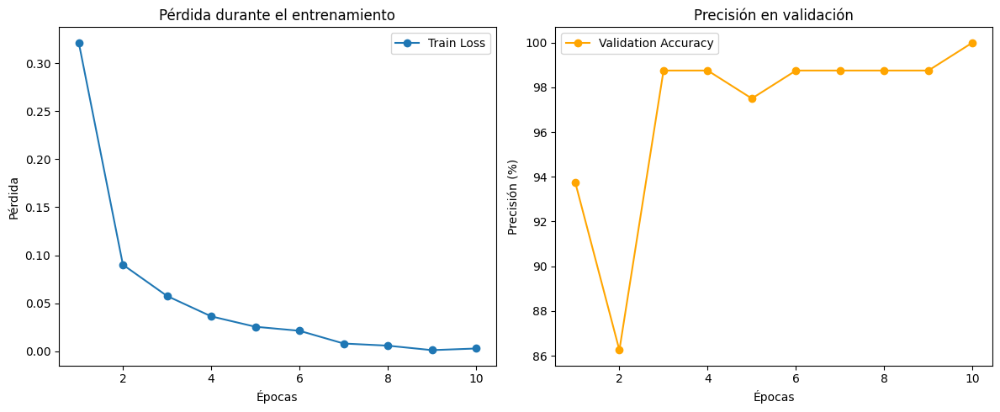

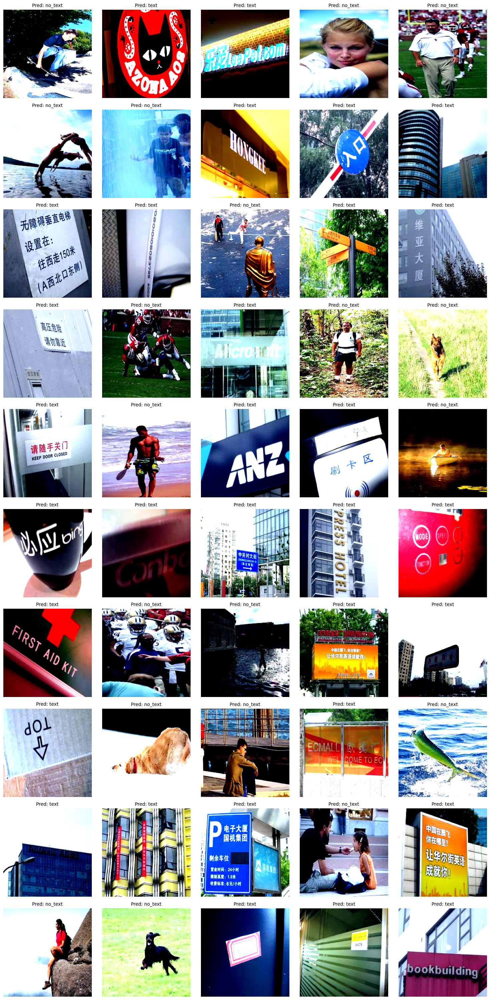

/content/drive/MyDrive/Colab_Notebooks/build/mobile_vit
Modelo salvado en la ruta: /content/drive/MyDrive/Colab_Notebooks/build/mobile_vit
'Copia de mobilevit_text_classification_v1.pth'   mobilevit_text_classification_v2.pth
 mobilevit_4to_exp_v1.pth			  mobile_vit.tflite
 mobilevit_text_classification_v1.onnx		  Mobile_Vit.tflite
 mobilevit_text_classification_v1.pth


In [4]:
# 4. Entrenar y evaluar el modelo
#    Define un bucle de entrenamiento para
#    actualizar los pesos del modelo usando los datos de entrenamiento.

import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import torch
from PIL import Image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Inicializar listas para métricas
train_losses = []  # Pérdida promedio en cada época
val_accuracies = []  # Precisión promedio en validación
evaluated_images = []  # Para almacenar imágenes de validación
evaluated_predictions = []  # Para almacenar predicciones de validación

# Entrenamiento y evaluación
num_epochs = 10
for epoch in range(num_epochs):
    # Entrenamiento
    model.train()
# Se usa running_loss para calcular la pérdida promedio:
# Al dividir running_loss por el número total de batches
# (len(train_loader)) para obtener la pérdida promedio al final de la época.
# Esto ayuda a evaluar si el modelo está aprendiendo correctamente
# (la pérdida debería disminuir con el tiempo).
# Seguimiento durante el entrenamiento:
# Si se imprime en cada iteración, puede dar información sobre
# cómo se comporta la pérdida en tiempo real.
# Útil para depuración, pero generalmente se reporta al final de cada época.
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)  # Forward
        loss = criterion(outputs, labels)  # Calcular pérdida
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    train_losses.append(running_loss / len(train_loader))  # Pérdida promedio de la época

# Evaluación en el conjunto de validación
    model.eval()
    all_labels = []
    all_predictions = []
    evaluated_images.clear()
    evaluated_predictions.clear()
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)  # Forward
            _, predictions = torch.max(outputs, 1)

            # Guardar etiquetas y predicciones
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predictions.cpu().numpy())

            # Guardar imágenes y predicciones para visualización
            if len(evaluated_images) < 50:  # Limitar a 50 imágenes
                evaluated_images.extend(inputs.cpu())
                evaluated_predictions.extend(predictions.cpu().numpy())

    # Calcular precisión
    accuracy = accuracy_score(all_labels, all_predictions)
    val_accuracies.append(accuracy * 100)  # Precisión en porcentaje
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {train_losses[-1]:.4f}, Validation Accuracy: {val_accuracies[-1]:.2f}%")

# --- Graficar métricas ---
plt.figure(figsize=(12, 5))

# Pérdida de entrenamiento
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss", marker='o')
plt.xlabel("Épocas")
plt.ylabel("Pérdida")
plt.title("Pérdida durante el entrenamiento")
plt.legend()

# Precisión en validación
plt.subplot(1, 2, 2)
plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label="Validation Accuracy", color="orange", marker='o')
plt.xlabel("Épocas")
plt.ylabel("Precisión (%)")
plt.title("Precisión en validación")
plt.legend()

plt.tight_layout()
plt.show()

# --- Mostrar imágenes evaluadas ---
def show_image_grid(images, predictions, classes, rows=10, cols=5):
    """
    Muestra un grid de imágenes con sus predicciones.

    Args:
        images: Lista de imágenes (tensores).
        predictions: Lista de predicciones.
        classes: Lista con nombres de las clases.
        rows: Número de filas en el grid.
        cols: Número de columnas en el grid.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(15, 30))
    axes = axes.flatten()

    for img, pred, ax in zip(images[:rows*cols], predictions[:rows*cols], axes):
        # Convertir tensor a imagen y desnormalizar
        img = img.permute(1, 2, 0).numpy()  # Cambiar ejes a (H, W, C)
        img = (img * 0.5) + 0.5  # Desnormalizar
        img = img.clip(0, 1)  # Asegurar rango [0, 1]

        ax.imshow(img)
        ax.set_title(f"Pred: {classes[pred]}", fontsize=10)
        ax.axis('off')

    for ax in axes[len(images):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Clases del modelo
classes = ['no_text', 'text']

# Mostrar 50 imágenes evaluadas
show_image_grid(evaluated_images, evaluated_predictions, classes, rows=10, cols=5)

# 6. Guardar el modelo entrenado
#    Guarda el modelo fine-tuneado para su uso posterior.
%cd /content/drive/MyDrive/Colab_Notebooks/build/mobile_vit
torch.save(model.state_dict(), "mobilevit_4to_exp_v1.pth")

import os
print(f"Modelo salvado en la ruta: {os.getcwd()}")
!ls


/usr/local/lib/python3.10/dist-packages/transformers/models/mobilevit/feature_extraction_mobilevit.py:28: FutureWarning: The class MobileViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use MobileViTImageProcessor instead.
  warnings.warn(
<ipython-input-6-7017d6e8cb75>:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you s

Modelo cargado correctamente.
Epoch 1/10, Loss: 0.0250, Validation Accuracy: 98.75%
Epoch 2/10, Loss: 0.0225, Validation Accuracy: 100.00%
Epoch 3/10, Loss: 0.0383, Validation Accuracy: 100.00%
Epoch 4/10, Loss: 0.0161, Validation Accuracy: 100.00%
Epoch 5/10, Loss: 0.0257, Validation Accuracy: 100.00%
Epoch 6/10, Loss: 0.0161, Validation Accuracy: 100.00%
Epoch 7/10, Loss: 0.0082, Validation Accuracy: 100.00%
Epoch 8/10, Loss: 0.0092, Validation Accuracy: 100.00%
Epoch 9/10, Loss: 0.0280, Validation Accuracy: 100.00%
Epoch 10/10, Loss: 0.0182, Validation Accuracy: 100.00%


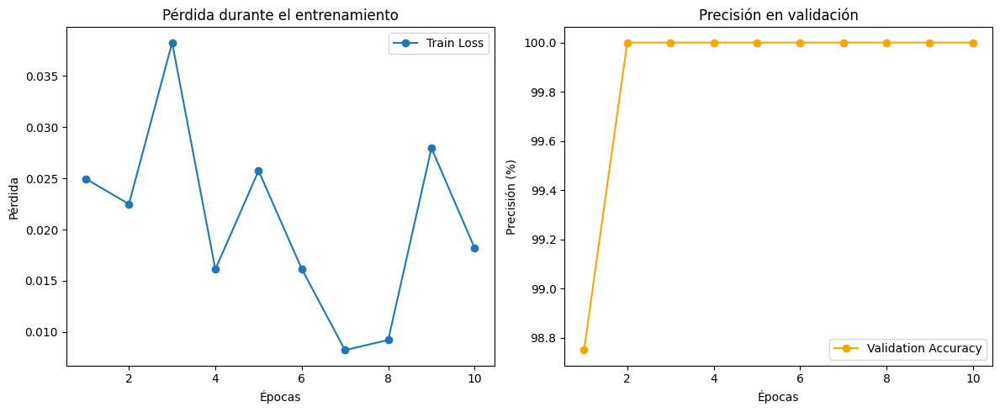

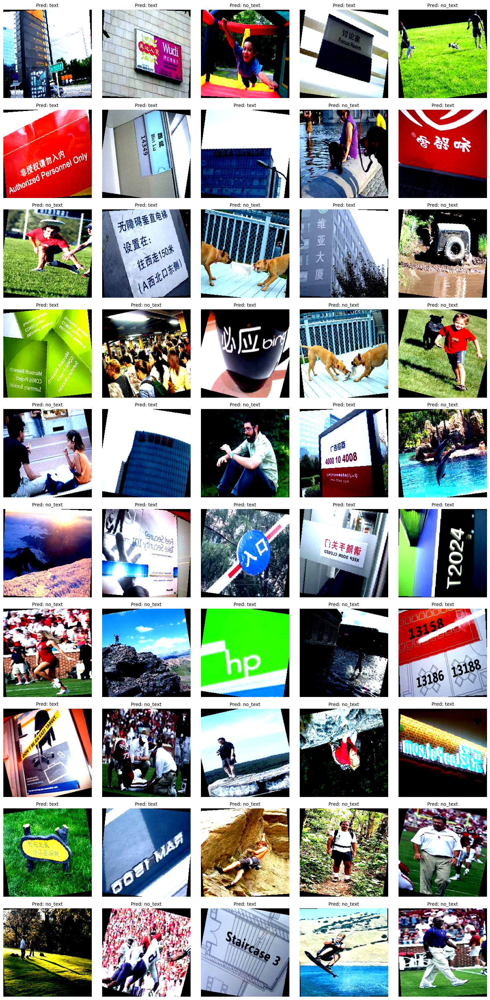

/content/drive/MyDrive/Colab_Notebooks/build/mobile_vit
Modelo salvado en la ruta: /content/drive/MyDrive/Colab_Notebooks/build/mobile_vit
'Copia de mobilevit_text_classification_v1.pth'   mobilevit_text_classification_v1.pth
 mobilevit_4to_exp_v1.pth			  mobilevit_text_classification_v2.pth
 mobilevit_4to_exp_v2.pth			  mobile_vit.tflite
 mobilevit_text_classification_v1.onnx		  Mobile_Vit.tflite
Distribución de clases en entrenamiento: Counter({0: 160, 1: 160})
Distribución de clases en validación: Counter({1: 40, 0: 40})


In [6]:
# 1. Configura el modelo entrenado y guardado previamente
#

from qai_hub_models.models.mobile_vit.model import MobileVIT
import torch

# Configura el modelo
model = MobileVIT.from_pretrained()  # Asegúrate de usar el mismo método de inicialización
model.net.classifier = torch.nn.Linear(model.net.classifier.in_features, 2)  # Ajustar para 2 clases

# Cargar los pesos guardados
model.load_state_dict(torch.load("/content/drive/MyDrive/Colab_Notebooks/build/mobile_vit/mobilevit_4to_exp_v1.pth"))
model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
print("Modelo cargado correctamente.")

# 2. Preparar los datos
# Si los datos de entrenamiento y validación están configurados como en el
# entrenamiento inicial, se puede reutilizar el pipeline de datos.

#1. Carga de datos
#   En conjunto de datos esta dividido en dos carpetas: text (con texto) y no_text (sin texto).
#   Usa torchvision.datasets.ImageFolder para cargar estos datos y dividirlos en conjuntos de entrenamiento y validación.

import os
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Definir transformaciones para las imágenes con augmentacion
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),  # Aumentos de datos - Volteo horizontal aleatorio
    transforms.RandomRotation(15),  # Aumentos de datos - Rotación aleatoria
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalización basada en ImageNet
])

# Cargar el dataset con ImageFolder
dataset_path = "/content/drive/MyDrive/Colab_Notebooks/dataset/text_recognition_balanceado"
dataset = datasets.ImageFolder(root=dataset_path, transform=transform)

# Dividir en entrenamiento y validación
from torch.utils.data import random_split

train_size = int(0.8 * len(dataset))  # 80% para entrenamiento
val_size = len(dataset) - train_size  # 20% para validación
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Crear dataloaders
batch_size = 32 #Es un tamaño común para GPUs con memoria moderada (8-16 GB). Si hay más recursos disponibles, puede aumentarse para acelerar el entrenamiento.
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


# Entrenar y evaluar el modelo
#    Define un bucle de entrenamiento para
#    actualizar los pesos del modelo usando los datos de entrenamiento.

import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import torch
from PIL import Image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Inicializar listas para métricas
train_losses = []  # Pérdida promedio en cada época
val_accuracies = []  # Precisión promedio en validación
evaluated_images = []  # Para almacenar imágenes de validación
evaluated_predictions = []  # Para almacenar predicciones de validación

# Entrenamiento y evaluación
num_epochs = 10
for epoch in range(num_epochs):
    # Entrenamiento
    model.train()
# Se usa running_loss para calcular la pérdida promedio:
# Al dividir running_loss por el número total de batches
# (len(train_loader)) para obtener la pérdida promedio al final de la época.
# Esto ayuda a evaluar si el modelo está aprendiendo correctamente
# (la pérdida debería disminuir con el tiempo).
# Seguimiento durante el entrenamiento:
# Si se imprime en cada iteración, puede dar información sobre
# cómo se comporta la pérdida en tiempo real.
# Útil para depuración, pero generalmente se reporta al final de cada época.
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)  # Forward
        loss = criterion(outputs, labels)  # Calcular pérdida
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    train_losses.append(running_loss / len(train_loader))  # Pérdida promedio de la época

# Evaluación en el conjunto de validación
    model.eval()
    all_labels = []
    all_predictions = []
    evaluated_images.clear()
    evaluated_predictions.clear()
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)  # Forward
            _, predictions = torch.max(outputs, 1)

            # Guardar etiquetas y predicciones
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predictions.cpu().numpy())

            # Guardar imágenes y predicciones para visualización
            if len(evaluated_images) < 50:  # Limitar a 50 imágenes
                evaluated_images.extend(inputs.cpu())
                evaluated_predictions.extend(predictions.cpu().numpy())

    # Calcular precisión
    accuracy = accuracy_score(all_labels, all_predictions)
    val_accuracies.append(accuracy * 100)  # Precisión en porcentaje
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {train_losses[-1]:.4f}, Validation Accuracy: {val_accuracies[-1]:.2f}%")

# --- Graficar métricas ---
plt.figure(figsize=(12, 5))

# Pérdida de entrenamiento
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss", marker='o')
plt.xlabel("Épocas")
plt.ylabel("Pérdida")
plt.title("Pérdida durante el entrenamiento")
plt.legend()

# Precisión en validación
plt.subplot(1, 2, 2)
plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label="Validation Accuracy", color="orange", marker='o')
plt.xlabel("Épocas")
plt.ylabel("Precisión (%)")
plt.title("Precisión en validación")
plt.legend()

plt.tight_layout()
plt.show()

# --- Mostrar imágenes evaluadas ---
def show_image_grid(images, predictions, classes, rows=10, cols=5):
    """
    Muestra un grid de imágenes con sus predicciones.

    Args:
        images: Lista de imágenes (tensores).
        predictions: Lista de predicciones.
        classes: Lista con nombres de las clases.
        rows: Número de filas en el grid.
        cols: Número de columnas en el grid.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(15, 30))
    axes = axes.flatten()

    for img, pred, ax in zip(images[:rows*cols], predictions[:rows*cols], axes):
        # Convertir tensor a imagen y desnormalizar
        img = img.permute(1, 2, 0).numpy()  # Cambiar ejes a (H, W, C)
        img = (img * 0.5) + 0.5  # Desnormalizar
        img = img.clip(0, 1)  # Asegurar rango [0, 1]

        ax.imshow(img)
        ax.set_title(f"Pred: {classes[pred]}", fontsize=10)
        ax.axis('off')

    for ax in axes[len(images):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Clases del modelo
classes = ['no_text', 'text']

# Mostrar 50 imágenes evaluadas
show_image_grid(evaluated_images, evaluated_predictions, classes, rows=10, cols=5)

# Guardar el modelo entrenado
#    Guarda el modelo fine-tuneado para su uso posterior.
%cd /content/drive/MyDrive/Colab_Notebooks/build/mobile_vit
torch.save(model.state_dict(), "mobilevit_4to_exp_v2.pth")

import os
print(f"Modelo salvado en la ruta: {os.getcwd()}")
!ls

# Revisar si los datos están desbalanceados
# Se comprueba la distribución de clases en el dataset.
# Balanceamos set de datos y comprobamos de nuevo

from collections import Counter

# Revisar clases en el dataset
train_labels = [label for _, label in train_dataset]
val_labels = [label for _, label in val_dataset]

print("Distribución de clases en entrenamiento:", Counter(train_labels))
print("Distribución de clases en validación:", Counter(val_labels))

# Matriz de confusión

La **matriz de confusión** proporciona un análisis detallado del rendimiento del modelo en términos de clasificaciones correctas e incorrectas para las clases `no_text` y `text`. Aquí está el desglose de los resultados mostrados:

---

### **Interpretación de la Matriz de Confusión**
1. **Ejes de la matriz**:
   - El eje **vertical** representa las **etiquetas reales** del conjunto de validación.
   - El eje **horizontal** representa las **predicciones del modelo**.

2. **Valores en la matriz**:
   - **(30)**: Cantidad de imágenes correctamente clasificadas como `no_text`.
   - **(27)**: Cantidad de imágenes correctamente clasificadas como `text`.
   - **(48)**: Cantidad de imágenes clasificadas incorrectamente como `text` cuando eran `no_text`.
   - **(16)**: Cantidad de imágenes clasificadas incorrectamente como `no_text` cuando eran `text`.

---

### **Análisis del Modelo**
#### **Rendimiento general**:
- El modelo muestra un rendimiento **moderado**, ya que hay muchas clasificaciones incorrectas, especialmente para la clase `no_text`.

#### **Errores predominantes**:
- El modelo confunde frecuentemente imágenes de `no_text` como `text` (**48 casos**). Esto podría deberse a:
  - Similitudes visuales entre las clases.
  - Falta de información distintiva en las características de la clase `no_text`.

#### **Clasificaciones correctas**:
- **57 imágenes clasificadas correctamente**:
  - `no_text`: 30 correctas.
  - `text`: 27 correctas.

#### **Tasa de error**:
- **Errores totales**:
  - `48 (falsos positivos)` + `16 (falsos negativos)` = **64 errores**.
- **Precisión del modelo**:
    - Precisión del modelo= correctas/total
    - Precisión del modelo = 57/121 ≈ 47.1%

/usr/local/lib/python3.10/dist-packages/transformers/models/mobilevit/feature_extraction_mobilevit.py:28: FutureWarning: The class MobileViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use MobileViTImageProcessor instead.
  warnings.warn(
<ipython-input-29-e523469d4127>:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you 

Modelo cargado correctamente.


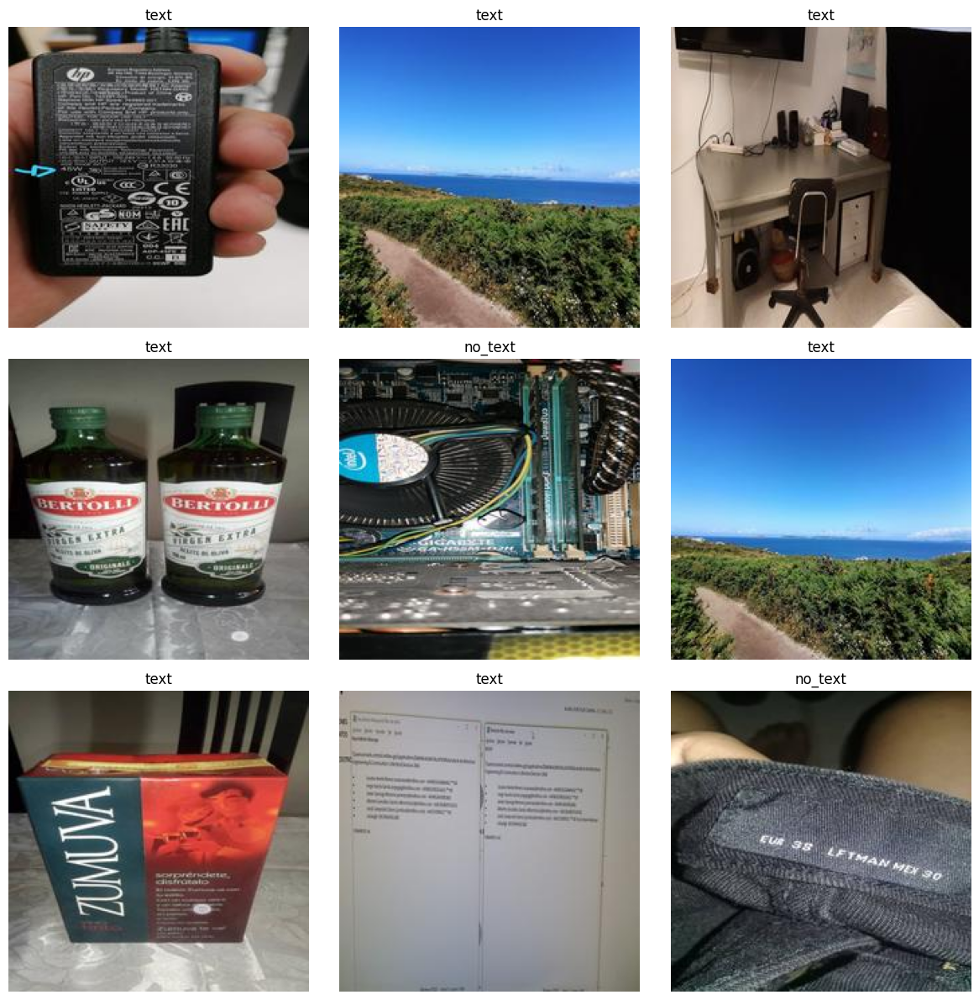

In [ ]:
# INFERENCIA
# Del modelo MOBILE ViT

import os
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

from qai_hub_models.models.mobile_vit.model import MobileVIT

# Configura el modelo
model = MobileVIT.from_pretrained()  # Asegúrate de usar el mismo método de inicialización
model.net.classifier = torch.nn.Linear(model.net.classifier.in_features, 2)  # Ajustar para 2 clases

# Cargar los pesos guardados
model.load_state_dict(torch.load("/content/drive/MyDrive/Colab_Notebooks/build/mobile_vit/mobilevit_text_classification_v4.pth"))
model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
print("Modelo cargado correctamente.")

# Transformaciones para preprocesar imágenes
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Ajustar según tu modelo
])

# Clases del modelo
classes = ['no_text', 'text']

# Función para evaluar imágenes en un directorio
def evaluate_images_in_directory(model, directory_path, device, max_images=9):
    """
    Evalúa todas las imágenes en un directorio y muestra un grid con las predicciones del modelo.

    Args:
        model: Modelo entrenado para evaluación.
        directory_path: Ruta al directorio con imágenes.
        device: Dispositivo (CPU/GPU) en el que correr el modelo.
        max_images: Número máximo de imágenes a mostrar en el grid (default: 9).
    """
    # Obtener la lista de imágenes en el directorio
    image_paths = [os.path.join(directory_path, f) for f in os.listdir(directory_path) if f.endswith(('png', 'jpg', 'jpeg'))]

    if not image_paths:
        print("No se encontraron imágenes en el directorio.")
        return

    # Limitar al número máximo de imágenes
    image_paths = image_paths[:max_images]

    model.eval()  # Poner el modelo en modo evaluación
    images = []
    predictions = []

    with torch.no_grad():
        for img_path in image_paths:
            # Cargar y preprocesar cada imagen
            img = Image.open(img_path).convert('RGB')
            img_transformed = transform(img).unsqueeze(0).to(device)

            # Predicción del modelo
            output = model(img_transformed)
            _, pred = torch.max(output, 1)

            # Guardar imagen y predicción
            images.append(img)
            predictions.append(classes[pred.item()])

    # Mostrar las imágenes en un grid
    show_image_grid(images, predictions)

# Función para mostrar un grid de imágenes con títulos
def show_image_grid(images, titles, rows=3, cols=3):
    """
    Muestra un grid de imágenes con títulos.

    Args:
        images: Lista de imágenes (PIL Images).
        titles: Lista de títulos para cada imagen.
        rows: Número de filas en el grid.
        cols: Número de columnas en el grid.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(12, 12))
    axes = axes.flatten()

    for img, title, ax in zip(images, titles, axes):
        ax.imshow(img)
        ax.set_title(title, fontsize=12)
        ax.axis('off')

    # Ocultar los ejes adicionales si hay menos imágenes que slots
    for ax in axes[len(images):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Ruta al directorio con imágenes
directory_path = "/content/drive/MyDrive/Colab_Notebooks/dataset/images/DescargasdeAmazonPhotos/WhatsAppImagesPruebaTexto"

# Evaluar y mostrar resultados
evaluate_images_in_directory(model, directory_path, device, max_images=9)
